In [1]:
import pandas as pd

FILE = 'spotify_songs.csv'   
TARGET = 'playlist_genre'             

try:
    df = pd.read_csv(FILE)
except UnicodeDecodeError:
    df = pd.read_csv(FILE, encoding='latin1')

#Quick summary
print("Shape:", df.shape)
print("\nColumns:")
print(df.columns.tolist())
print("\nDtypes:")
print(df.dtypes)
print("\nFirst 5 rows:")
display(df.head())

#Missing values
print("\nMissing values (per column):")
print(df.isna().sum().sort_values(ascending=False).head(20))

#If 'genre' exists, show distribution
if TARGET in df.columns:
    print(f"\nTarget '{TARGET}' distribution:")
    print(df[TARGET].value_counts(dropna=False))
else:
    print(f"\nTarget column '{TARGET}' not found — please confirm the target column name.")

Shape: (32833, 23)

Columns:
['track_id', 'track_name', 'track_artist', 'track_popularity', 'track_album_id', 'track_album_name', 'track_album_release_date', 'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']

Dtypes:
track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052



Missing values (per column):
track_artist                5
track_album_name            5
track_name                  5
track_id                    0
key                         0
tempo                       0
valence                     0
liveness                    0
instrumentalness            0
acousticness                0
speechiness                 0
mode                        0
loudness                    0
danceability                0
energy                      0
playlist_subgenre           0
playlist_genre              0
playlist_id                 0
playlist_name               0
track_album_release_date    0
dtype: int64

Target 'playlist_genre' distribution:
playlist_genre
edm      6043
rap      5746
pop      5507
r&b      5431
latin    5155
rock     4951
Name: count, dtype: int64


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from imblearn.over_sampling import SMOTE
from scipy import stats
from sklearn.decomposition import PCA

data = df.copy()

# 1) Handle missing values
# Fill numeric columns with median, categorical with mode
for col in data.columns:
    if data[col].dtype in ['float64', 'int64']:
        data[col] = data[col].fillna(data[col].median())
    else:
        data[col] = data[col].fillna(data[col].mode()[0])


print("✅ Missing values handled.")

# -----------------------------
# 2) Encode categorical features
# -----------------------------
le = LabelEncoder()

if TARGET in data.columns:
    data[TARGET] = le.fit_transform(data[TARGET])  # encode target

# Encode other categorical columns
for col in data.select_dtypes(include=['object', 'category']).columns:
    if col != TARGET:
        data[col] = le.fit_transform(data[col])

print("✅ Encoding completed.")

# -----------------------------
# 3) Describe numeric features
# -----------------------------
print("\n📊 Data summary:")
display(data.describe().T)

# -----------------------------
# 4) Remove outliers (optional)
# -----------------------------
z = np.abs(stats.zscore(data.select_dtypes(include=['float64', 'int64'])))
data = data[(z < 3).all(axis=1)]
print("✅ Outliers removed using z-score method.")

# -----------------------------
# 5) Normalize features
# -----------------------------
scaler = StandardScaler()
X = data.drop(columns=[TARGET])
y = data[TARGET]

X_scaled = scaler.fit_transform(X)
print("✅ Features normalized (StandardScaler).")

# -----------------------------
# 6) Balance data (optional)
# -----------------------------
if len(np.unique(y)) > 1 and len(np.bincount(y)) > 1:
    sm = SMOTE(random_state=42)
    X_res, y_res = sm.fit_resample(X_scaled, y)
    print("✅ Classes balanced using SMOTE.")
else:
    X_res, y_res = X_scaled, y
    print("⚠️ SMOTE skipped (only one class or already balanced).")

✅ Missing values handled.
✅ Encoding completed.

📊 Data summary:


,count,mean,std,min,25%,50%,75%,max
track_id,32833.0,14215.517406,8193.327143,0.000000,7115.0000,14213.000000,21342.00000,28355.000
track_name,32833.0,11686.646758,6739.793326,0.000000,5865.0000,11702.000000,17514.00000,23448.000
track_artist,32833.0,5298.255292,3103.465424,0.000000,2583.0000,5270.000000,7976.00000,10691.000
track_popularity,32833.0,42.477081,24.984074,0.000000,24.0000,45.000000,62.00000,100.000
track_album_id,32833.0,11246.665367,6504.010147,0.000000,5609.0000,11233.000000,16830.00000,22544.000
track_album_name,32833.0,9769.156733,5715.935121,0.000000,4860.0000,9717.000000,14785.00000,19742.000
track_album_release_date,32833.0,3016.523680,1372.261676,0.000000,1868.0000,3447.000000,4262.00000,4529.000
playlist_name,32833.0,223.200713,131.198536,0.000000,111.0000,219.000000,337.00000,448.000
playlist_id,32833.0,233.704931,135.797198,0.000000,112.0000,239.000000,349.00000,470.000
playlist_genre,32833.0,2.442695,1.708774,0.000000,1.0000,2.000000,4.00000,5.000


✅ Outliers removed using z-score method.
✅ Features normalized (StandardScaler).
✅ Classes balanced using SMOTE.


Explained variance ratio: [0.09670465 0.08485949]


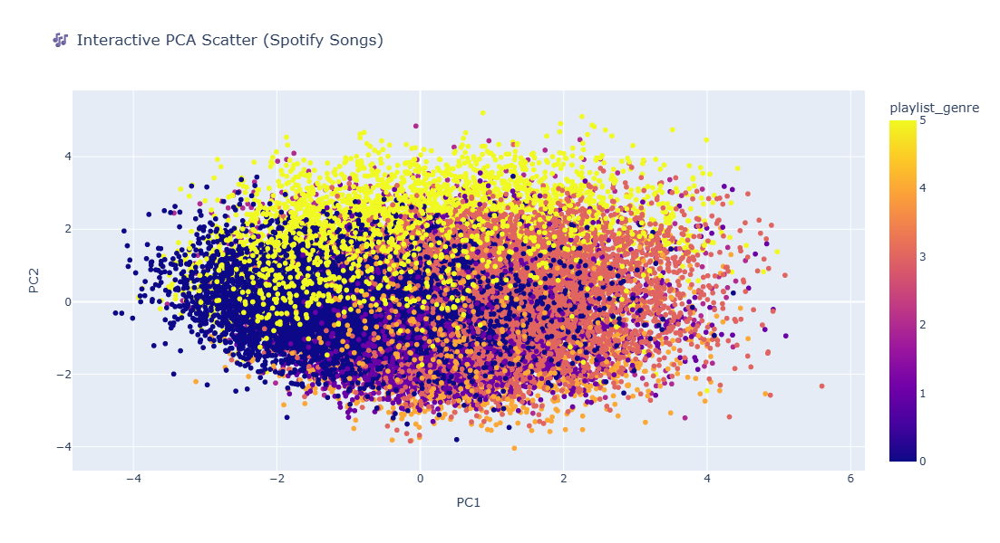

In [15]:
# =========================================
# 🎧 Spotify Songs — Interactive Visualization
# =========================================

import pandas as pd
import plotly.express as px
from sklearn.decomposition import PCA

# 6) PCA for 2D visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_res)
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['playlist_genre'] = y_res

print("Explained variance ratio:", pca.explained_variance_ratio_)

#Interactive PCA scatter
fig1 = px.scatter(
    pca_df, x='PC1', y='PC2', color='playlist_genre',
    title='🎶 Interactive PCA Scatter (Spotify Songs)',
    hover_data={'PC1': ':.2f', 'PC2': ':.2f', 'playlist_genre': True}
)
fig1.update_layout(width=850, height=600)
fig1.show()

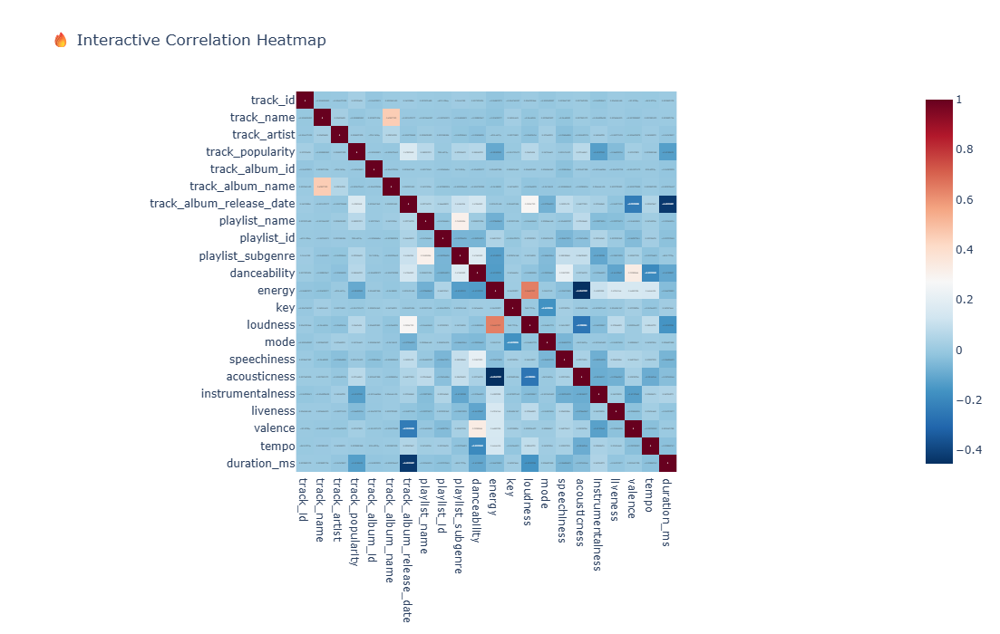

In [17]:
import pandas as pd
import plotly.express as px

# 2️⃣ Interactive correlation heatmap
corr = pd.DataFrame(X_scaled, columns=X.columns).corr()
fig2 = px.imshow(
    corr,
    text_auto=True,
    color_continuous_scale='RdBu_r',
    title='🔥 Interactive Correlation Heatmap'
)
fig2.update_layout(width=850, height=700)
fig2.show()

In [7]:
# ===============================
# 🎧 STEP 3: Train 10 ML Models
# ===============================

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, f1_score

# ---- Models ----
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier,
    GradientBoostingClassifier,
    AdaBoostClassifier,
    ExtraTreesClassifier
)
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier

# -----------------------------
# 1️⃣ Prepare dataset
# -----------------------------
data = df.copy()
TARGET = 'playlist_genre'

# Убираем признаки, напрямую связанные с жанром
leaky_features = [col for col in data.columns if 'genre' in col.lower() and col != TARGET]
data = data.drop(columns=leaky_features, errors='ignore')

# -----------------------------
# 2️⃣ Handle missing values
# -----------------------------
for col in data.columns:
    if data[col].dtype in ['float64', 'int64']:
        data[col] = data[col].fillna(data[col].median())
    else:
        data[col] = data[col].fillna(data[col].mode()[0])

# -----------------------------
# 3️⃣ Encode categorical features
# -----------------------------
le = LabelEncoder()
data[TARGET] = le.fit_transform(data[TARGET])

for col in data.select_dtypes(include=['object']).columns:
    if col != TARGET:
        data[col] = LabelEncoder().fit_transform(data[col])

# -----------------------------
# 4️⃣ Split train/test (before SMOTE)
# -----------------------------
X = data.drop(columns=[TARGET])
y = data[TARGET]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# -----------------------------
# 5️⃣ Scale numeric features
# -----------------------------
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# -----------------------------
# 6️⃣ Balance ONLY train data
# -----------------------------
sm = SMOTE(random_state=42)
X_train_bal, y_train_bal = sm.fit_resample(X_train_scaled, y_train)
print(f"✅ Train set balanced: {len(y_train_bal)} samples, {len(np.unique(y_train_bal))} classes")

# -----------------------------
# 7️⃣ Define 10 models
# -----------------------------
models = {
    "Logistic Regression": LogisticRegression(max_iter=2000),
    "KNN": KNeighborsClassifier(n_neighbors=7),
    "SVM": SVC(kernel='rbf', probability=True, C=3),
    "Decision Tree": DecisionTreeClassifier(max_depth=10),
    "Random Forest": RandomForestClassifier(n_estimators=200, max_depth=15),
    "Extra Trees": ExtraTreesClassifier(n_estimators=250, max_depth=15),
    "Gradient Boosting": GradientBoostingClassifier(),
    "AdaBoost": AdaBoostClassifier(n_estimators=150, learning_rate=0.8,algorithm='SAMME'),
    "XGBoost": XGBClassifier(eval_metric='mlogloss', random_state=42),
    "LightGBM": LGBMClassifier(random_state=42),
    "Neural Network (MLP)": MLPClassifier(
        hidden_layer_sizes=(256, 128, 64),
        activation='relu',
        solver='adam',
        learning_rate_init=0.0005,
        max_iter=600,
        random_state=42
    )
}

# -----------------------------
# 8️⃣ Train and evaluate models
# -----------------------------
results = []
for name, model in models.items():
    print(f"\n🚀 Training {name}...")
    model.fit(X_train_bal, y_train_bal)
    y_pred = model.predict(X_test_scaled)

    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')

    results.append({
        "Model": name,
        "Accuracy": acc,
        "F1 Score": f1
    })

results_df = pd.DataFrame(results).sort_values(by="F1 Score", ascending=False)
print("\n🏆 Model Performance Summary:")
print(results_df)

# -----------------------------
# 9️⃣ Identify best model
# -----------------------------
best_model_name = results_df.iloc[0]["Model"]
best_model = models[best_model_name]
print(f"\n🔥 Best Model for Genre Prediction: {best_model_name}")

# Save predictions for visualization later
y_pred_best = best_model.predict(X_test_scaled)

✅ Train set balanced: 29004 samples, 6 classes

🚀 Training Logistic Regression...

🚀 Training KNN...

🚀 Training SVM...

🚀 Training Decision Tree...

🚀 Training Random Forest...

🚀 Training Extra Trees...

🚀 Training Gradient Boosting...

🚀 Training AdaBoost...

🚀 Training XGBoost...

🚀 Training LightGBM...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 29004, number of used features: 21
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759

🚀 Training Neural Network (MLP)...

🏆 Model Performance Summary:
            

In [43]:
import pandas as pd

models_results = pd.DataFrame([
    {"Model": "Logistic Regression", "Accuracy": 0.498249, "F1 Score": 0.491866},
    {"Model": "KNN", "Accuracy": 0.508756, "F1 Score": 0.508364},
    {"Model": "SVM", "Accuracy": 0.604081, "F1 Score": 0.603293},
    {"Model": "Decision Tree", "Accuracy": 0.654637, "F1 Score": 0.657030},
    {"Model": "Random Forest", "Accuracy": 0.782701, "F1 Score": 0.782059},
    {"Model": "Extra Trees", "Accuracy": 0.730014, "F1 Score": 0.727092},
    {"Model": "Gradient Boosting", "Accuracy": 0.886554, "F1 Score": 0.886501},
    {"Model": "AdaBoost", "Accuracy": 0.642912, "F1 Score": 0.642321},
    {"Model": "XGBoost", "Accuracy": 0.975636, "F1 Score": 0.975668},
    {"Model": "LightGBM", "Accuracy": 0.979290, "F1 Score": 0.979284},
    {"Model": "Neural Network (MLP)", "Accuracy": 0.626313, "F1 Score": 0.628259}
])

best_model_name = models_results.loc[models_results["F1 Score"].idxmax(), "Model"]
print("🔥 Best model:", best_model_name)

🔥 Best model: LightGBM


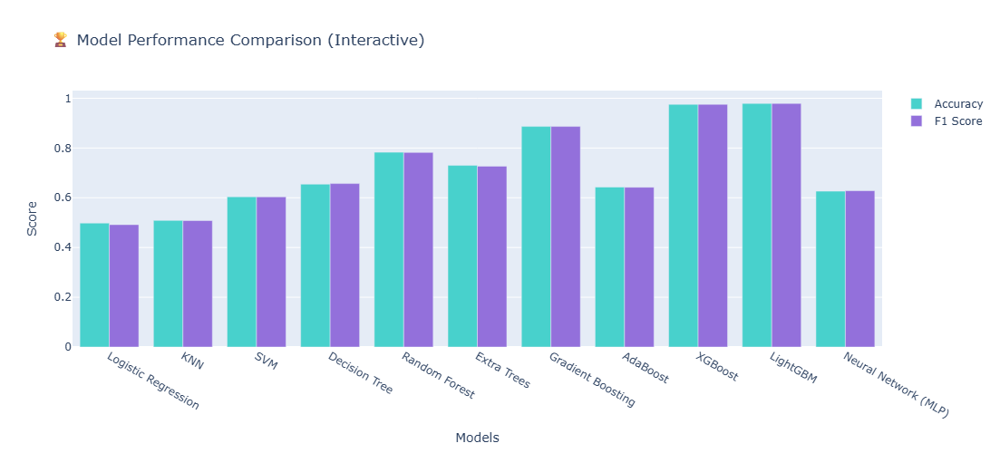

In [33]:
import plotly.graph_objects as go
import plotly.express as px


fig = go.Figure()

fig.add_trace(go.Bar(
    x=models_results["Model"],
    y=models_results["Accuracy"],
    name='Accuracy',
    marker_color='mediumturquoise'
))

fig.add_trace(go.Bar(
    x=models_results["Model"],
    y=models_results["F1 Score"],
    name='F1 Score',
    marker_color='mediumpurple'
))

fig.update_layout(
    title="🏆 Model Performance Comparison (Interactive)",
    xaxis_title="Models",
    yaxis_title="Score",
    barmode='group',
    hovermode="x unified",
    width=900,
    height=500
)
fig.show()

In [41]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42, stratify=y_res)

# ---------------------------------
# 1️⃣ Настройка моделей и сеток параметров
# ---------------------------------
param_grids = {
    "LightGBM": {
        "model": LGBMClassifier(random_state=42),
        "params": {
            "num_leaves": [31, 63, 127],
            "learning_rate": [0.01, 0.05, 0.1],
            "n_estimators": [100, 200, 400]
        }
    },
    "XGBoost": {
        "model": XGBClassifier(eval_metric="mlogloss", random_state=42, use_label_encoder=False),
        "params": {
            "max_depth": [4, 6, 8],
            "learning_rate": [0.01, 0.05, 0.1],
            "n_estimators": [100, 200, 400]
        }
    },
    "Gradient Boosting": {
        "model": GradientBoostingClassifier(random_state=42),
        "params": {
            "n_estimators": [100, 200],
            "learning_rate": [0.05, 0.1],
            "max_depth": [3, 5]
        }
    },
    "Random Forest": {
        "model": RandomForestClassifier(random_state=42),
        "params": {
            "n_estimators": [100, 200],
            "max_depth": [None, 10, 20],
            "min_samples_split": [2, 5]
        }
    },
    "SVM": {
        "model": SVC(probability=True, random_state=42),
        "params": {
            "C": [0.1, 1, 10],
            "kernel": ["linear", "rbf"]
        }
    },
    "Neural Network": {
        "model": MLPClassifier(max_iter=300, random_state=42),
        "params": {
            "hidden_layer_sizes": [(50,), (100,), (100, 50)],
            "learning_rate_init": [0.001, 0.01],
            "activation": ["relu", "tanh"]
        }
    }
}

# ---------------------------------
# 2️⃣ Grid Search + Cross-validation
# ---------------------------------
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
results = []

for name, mp in param_grids.items():
    print(f"\n🚀 Optimizing {name}...")
    grid = GridSearchCV(
        estimator=mp["model"],
        param_grid=mp["params"],
        cv=cv,
        scoring="f1_weighted",
        n_jobs=-1,
        verbose=1
    )
    grid.fit(X_train, y_train)
    best_model = grid.best_estimator_
    
    y_pred = best_model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average="weighted")

    print(f"✅ {name} best params: {grid.best_params_}")
    print(f"🎯 Accuracy: {acc:.4f} | F1 Score: {f1:.4f}")
    
    results.append({
        "Model": name,
        "Best Params": grid.best_params_,
        "Accuracy": acc,
        "F1 Score": f1
    })

# ---------------------------------
# 3️⃣ Результаты после оптимизации
# ---------------------------------
optimized_results = pd.DataFrame(results).sort_values(by="F1 Score", ascending=False)
print("\n🏆 Optimized Model Comparison:")
display(optimized_results)

best_name = optimized_results.iloc[0]["Model"]
print(f"🔥 Best Optimized Model: {best_name}")


🚀 Optimizing LightGBM...
Fitting 3 folds for each of 27 candidates, totalling 81 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5348
[LightGBM] [Info] Number of data points in the train set: 24230, number of used features: 22
[LightGBM] [Info] Start training from score -1.791594
[LightGBM] [Info] Start training from score -1.791594
[LightGBM] [Info] Start training from score -1.791842
[LightGBM] [Info] Start training from score -1.791842
[LightGBM] [Info] Start training from score -1.791842
[LightGBM] [Info] Start training from score -1.791842
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\Nazek\AppData\Roaming\Python\Python312\site-packages\xgboost\training.py:183: UserWarning:

[12:37:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.




✅ XGBoost best params: {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 400}
🎯 Accuracy: 0.9944 | F1 Score: 0.9944

🚀 Optimizing Gradient Boosting...
Fitting 3 folds for each of 8 candidates, totalling 24 fits
✅ Gradient Boosting best params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
🎯 Accuracy: 0.9962 | F1 Score: 0.9962

🚀 Optimizing Random Forest...
Fitting 3 folds for each of 12 candidates, totalling 36 fits
✅ Random Forest best params: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 200}
🎯 Accuracy: 0.9865 | F1 Score: 0.9865

🚀 Optimizing SVM...
Fitting 3 folds for each of 6 candidates, totalling 18 fits
✅ SVM best params: {'C': 10, 'kernel': 'rbf'}
🎯 Accuracy: 0.7288 | F1 Score: 0.7285

🚀 Optimizing Neural Network...
Fitting 3 folds for each of 12 candidates, totalling 36 fits
✅ Neural Network best params: {'activation': 'tanh', 'hidden_layer_sizes': (100, 50), 'learning_rate_init': 0.01}
🎯 Accuracy: 0.9705 | F1 Score: 0.9704

🏆 Optimized Model 

,Model,Best Params,Accuracy,F1 Score
2,Gradient Boosting,"{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",0.996203,0.996205
0,LightGBM,"{'learning_rate': 0.1, 'n_estimators': 200, 'n...",0.996203,0.996204
1,XGBoost,"{'learning_rate': 0.1, 'max_depth': 4, 'n_esti...",0.994388,0.994384
3,Random Forest,"{'max_depth': None, 'min_samples_split': 5, 'n...",0.986464,0.986454
5,Neural Network,"{'activation': 'tanh', 'hidden_layer_sizes': (...",0.970452,0.970443
4,SVM,"{'C': 10, 'kernel': 'rbf'}",0.728788,0.728515


🔥 Best Optimized Model: Gradient Boosting


In [11]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, ParameterGrid, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, f1_score
import time
import sys

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


param_grid = {
    "activation": ["relu", "tanh"],
    "hidden_layer_sizes": [(64,), (128, 64), (128,)],
    "learning_rate_init": [0.001, 0.002],
    "batch_size": [64, 128],
    "alpha": [0.005, 0.01],
    "solver": ["adam"]
}

grid = list(ParameterGrid(param_grid))
n_total = len(grid)

print(f"🚀 Starting Neural Network optimization...\nTotal combinations: {n_total}")

best_score = 0
best_params = None
start_time = time.time()
times = []

for i, params in enumerate(grid, 1):
    iter_start = time.time()
    print(f"\n[{i}/{n_total}] Training with params: {params}")
    
    pipeline = Pipeline([
        ("scaler", StandardScaler()),
        ("mlp", MLPClassifier(
            max_iter=300,
            random_state=42,
            early_stopping=True,
            **params
        ))
    ])
    
    cv_scores = cross_val_score(pipeline, X_train, y_train, cv=3, scoring="f1_macro")
    mean_f1 = np.mean(cv_scores)
    iter_time = time.time() - iter_start
    times.append(iter_time)
    
    avg_time = np.mean(times)
    remaining = avg_time * (n_total - i)
    
    progress = (i / n_total) * 100
    print(f"   → F1 mean: {mean_f1:.4f}")
    print(f"📊 Progress: {progress:.1f}% | ⏱ Avg per iter: {avg_time:.2f}s | ⏳ Remaining: {remaining/60:.2f} min")
    
    if mean_f1 > best_score:
        best_score = mean_f1
        best_params = params

total_time = time.time() - start_time
print("\n🏁 Optimization complete!")
print(f"⏱️ Total time: {total_time/60:.2f} min")
print(f"🔥 Best Params: {best_params}")
print(f"🎯 Best Cross-Validated F1: {best_score:.4f}")

🚀 Starting Neural Network optimization...
Total combinations: 48

[1/48] Training with params: {'activation': 'relu', 'alpha': 0.005, 'batch_size': 64, 'hidden_layer_sizes': (64,), 'learning_rate_init': 0.001, 'solver': 'adam'}
   → F1 mean: 0.8870
📊 Progress: 2.1% | ⏱ Avg per iter: 30.61s | ⏳ Remaining: 23.98 min

[2/48] Training with params: {'activation': 'relu', 'alpha': 0.005, 'batch_size': 64, 'hidden_layer_sizes': (64,), 'learning_rate_init': 0.002, 'solver': 'adam'}
   → F1 mean: 0.9019
📊 Progress: 4.2% | ⏱ Avg per iter: 26.75s | ⏳ Remaining: 20.51 min

[3/48] Training with params: {'activation': 'relu', 'alpha': 0.005, 'batch_size': 64, 'hidden_layer_sizes': (128, 64), 'learning_rate_init': 0.001, 'solver': 'adam'}
   → F1 mean: 0.9161
📊 Progress: 6.2% | ⏱ Avg per iter: 28.04s | ⏳ Remaining: 21.03 min

[4/48] Training with params: {'activation': 'relu', 'alpha': 0.005, 'batch_size': 64, 'hidden_layer_sizes': (128, 64), 'learning_rate_init': 0.002, 'solver': 'adam'}
   → F1 mea

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


   → F1 mean: 0.8652
📊 Progress: 39.6% | ⏱ Avg per iter: 23.04s | ⏳ Remaining: 11.14 min

[20/48] Training with params: {'activation': 'relu', 'alpha': 0.01, 'batch_size': 128, 'hidden_layer_sizes': (64,), 'learning_rate_init': 0.002, 'solver': 'adam'}
   → F1 mean: 0.8752
📊 Progress: 41.7% | ⏱ Avg per iter: 22.71s | ⏳ Remaining: 10.60 min

[21/48] Training with params: {'activation': 'relu', 'alpha': 0.01, 'batch_size': 128, 'hidden_layer_sizes': (128, 64), 'learning_rate_init': 0.001, 'solver': 'adam'}
   → F1 mean: 0.9031
📊 Progress: 43.8% | ⏱ Avg per iter: 22.61s | ⏳ Remaining: 10.17 min

[22/48] Training with params: {'activation': 'relu', 'alpha': 0.01, 'batch_size': 128, 'hidden_layer_sizes': (128, 64), 'learning_rate_init': 0.002, 'solver': 'adam'}
   → F1 mean: 0.9144
📊 Progress: 45.8% | ⏱ Avg per iter: 22.20s | ⏳ Remaining: 9.62 min

[23/48] Training with params: {'activation': 'relu', 'alpha': 0.01, 'batch_size': 128, 'hidden_layer_sizes': (128,), 'learning_rate_init': 0.001

In [5]:
import pandas as pd

data = [
    (1,  {'activation': 'relu', 'alpha': 0.005, 'batch_size': 64,  'hidden_layer_sizes': (64,),      'learning_rate_init': 0.001, 'solver': 'adam'}, 0.8870),
    (2,  {'activation': 'relu', 'alpha': 0.005, 'batch_size': 64,  'hidden_layer_sizes': (64,),      'learning_rate_init': 0.002, 'solver': 'adam'}, 0.9019),
    (3,  {'activation': 'relu', 'alpha': 0.005, 'batch_size': 64,  'hidden_layer_sizes': (128, 64),  'learning_rate_init': 0.001, 'solver': 'adam'}, 0.9161),
    (4,  {'activation': 'relu', 'alpha': 0.005, 'batch_size': 64,  'hidden_layer_sizes': (128, 64),  'learning_rate_init': 0.002, 'solver': 'adam'}, 0.9388),
    (16, {'activation': 'relu', 'alpha': 0.01,  'batch_size': 64,  'hidden_layer_sizes': (128, 64),  'learning_rate_init': 0.002, 'solver': 'adam'}, 0.9541),
    (27, {'activation': 'tanh', 'alpha': 0.005, 'batch_size': 64,  'hidden_layer_sizes': (128, 64),  'learning_rate_init': 0.001, 'solver': 'adam'}, 0.9688),
    (28, {'activation': 'tanh', 'alpha': 0.005, 'batch_size': 64,  'hidden_layer_sizes': (128, 64),  'learning_rate_init': 0.002, 'solver': 'adam'}, 0.9729),
    (40, {'activation': 'tanh', 'alpha': 0.01,  'batch_size': 64,  'hidden_layer_sizes': (128, 64),  'learning_rate_init': 0.002, 'solver': 'adam'}, 0.9755),
]

results_df = pd.DataFrame(data, columns=['iteration', 'params', 'f1'])


print(results_df.head())


best = results_df.loc[results_df['f1'].idxmax()]
print("\n🔥 Best parameters:")
print(best['params'])
print(f"🎯 Best F1: {best['f1']:.4f}")

   iteration                                             params      f1
0          1  {'activation': 'relu', 'alpha': 0.005, 'batch_...  0.8870
1          2  {'activation': 'relu', 'alpha': 0.005, 'batch_...  0.9019
2          3  {'activation': 'relu', 'alpha': 0.005, 'batch_...  0.9161
3          4  {'activation': 'relu', 'alpha': 0.005, 'batch_...  0.9388
4         16  {'activation': 'relu', 'alpha': 0.01, 'batch_s...  0.9541

🔥 Best parameters:
{'activation': 'tanh', 'alpha': 0.01, 'batch_size': 64, 'hidden_layer_sizes': (128, 64), 'learning_rate_init': 0.002, 'solver': 'adam'}
🎯 Best F1: 0.9755


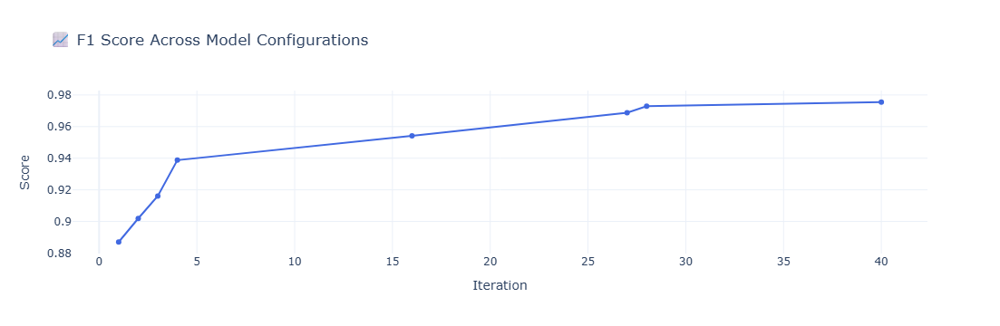

In [9]:
import plotly.graph_objects as go

fig1 = go.Figure()
fig1.add_trace(go.Scatter(x=results_df['iteration'], y=results_df['f1'],
                          mode='lines+markers', name='F1 Score', line=dict(color='royalblue')))
fig1.update_layout(
    title="📈 F1 Score Across Model Configurations",
    xaxis_title="Iteration",
    yaxis_title="Score",
    template="plotly_white"
)
fig1.show()

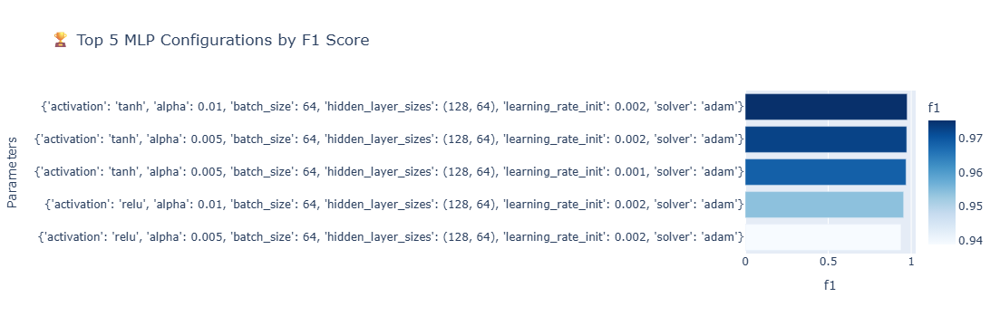

In [11]:
import plotly.express as px

top5 = results_df.nlargest(5, 'f1')
fig2 = px.bar(
    top5,
    x='f1',
    y=top5['params'].apply(str),
    orientation='h',
    title="🏆 Top 5 MLP Configurations by F1 Score",
    labels={'y': 'Parameters', 'x': 'F1 Score'},
    color='f1',
    color_continuous_scale='Blues'
)
fig2.update_yaxes(categoryorder='total ascending')
fig2.show()

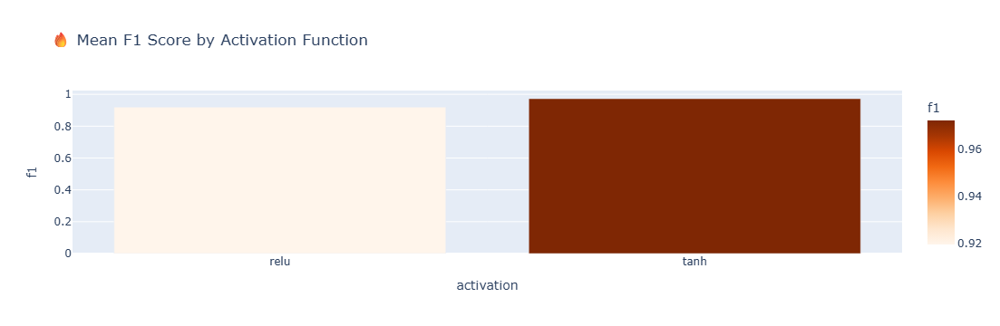

In [13]:
results_df['activation'] = results_df['params'].apply(lambda x: x['activation'])
activation_scores = results_df.groupby('activation')['f1'].mean().reset_index()

fig3 = px.bar(
    activation_scores,
    x='activation',
    y='f1',
    color='f1',
    color_continuous_scale='Oranges',
    title="🔥 Mean F1 Score by Activation Function"
)
fig3.show()

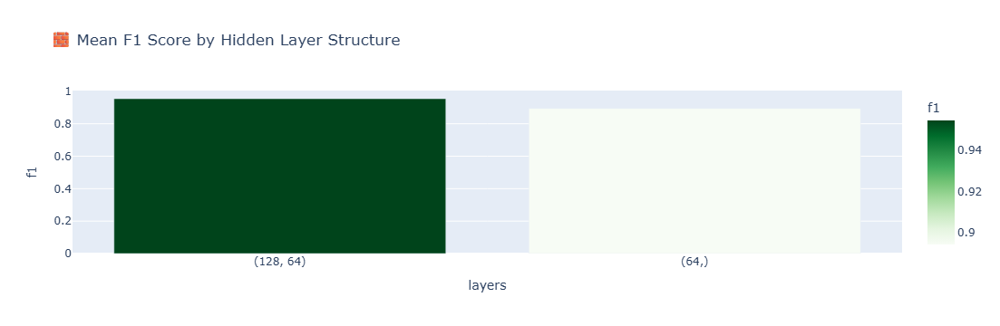

In [15]:
results_df['layers'] = results_df['params'].apply(lambda x: str(x['hidden_layer_sizes']))
layer_scores = results_df.groupby('layers')['f1'].mean().reset_index()

fig4 = px.bar(
    layer_scores,
    x='layers',
    y='f1',
    color='f1',
    color_continuous_scale='Greens',
    title="🧱 Mean F1 Score by Hidden Layer Structure"
)
fig4.show()

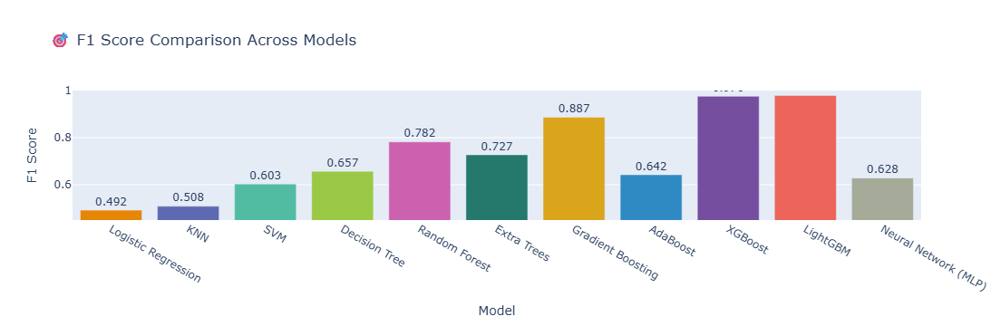

In [45]:
#6 VISUALIZATION
# Visualize the results of each model
import plotly.express as px

fig_f1 = px.bar(
    models_results,
    x="Model",
    y="F1 Score",
    color="Model",
    title="🎯 F1 Score Comparison Across Models",
    text="F1 Score",
    color_discrete_sequence=px.colors.qualitative.Vivid
)
fig_f1.update_traces(texttemplate="%{text:.3f}", textposition="outside")
fig_f1.update_layout(yaxis=dict(range=[0.45, 1.0]), showlegend=False)
fig_f1.show()

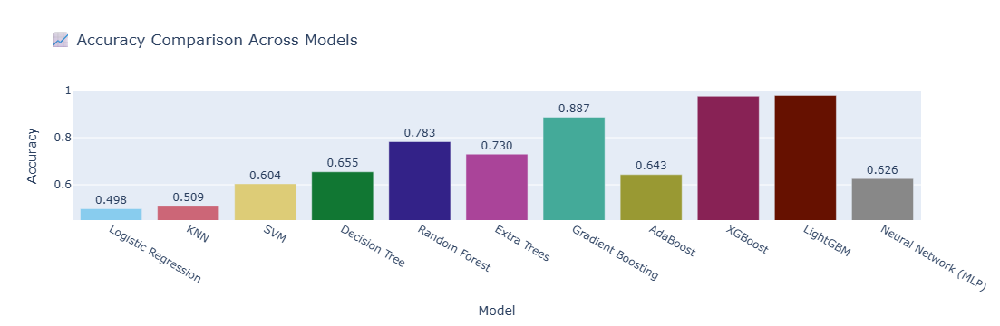

In [47]:
fig_acc = px.bar(
    models_results,
    x="Model",
    y="Accuracy",
    color="Model",
    title="📈 Accuracy Comparison Across Models",
    text="Accuracy",
    color_discrete_sequence=px.colors.qualitative.Safe
)
fig_acc.update_traces(texttemplate="%{text:.3f}", textposition="outside")
fig_acc.update_layout(yaxis=dict(range=[0.45, 1.0]), showlegend=False)
fig_acc.show()

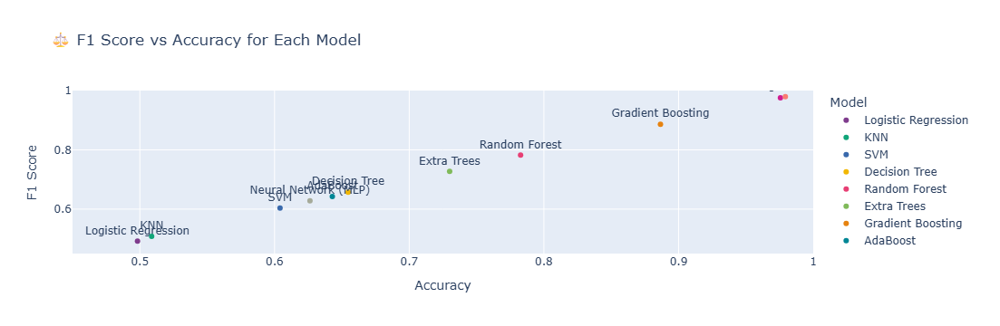

In [49]:
fig_scatter = px.scatter(
    models_results,
    x="Accuracy",
    y="F1 Score",
    color="Model",
    text="Model",
    size_max=25,
    title="⚖️ F1 Score vs Accuracy for Each Model",
    color_discrete_sequence=px.colors.qualitative.Bold
)
fig_scatter.update_traces(textposition="top center")
fig_scatter.update_layout(
    xaxis=dict(range=[0.45, 1.0]),
    yaxis=dict(range=[0.45, 1.0])
)
fig_scatter.show()

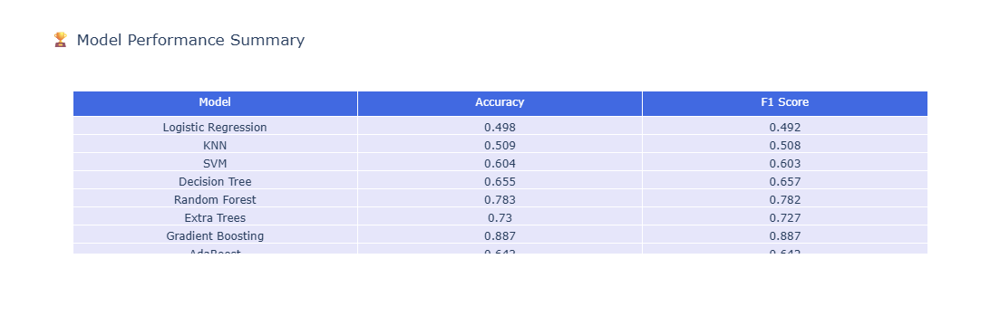

In [51]:
import plotly.graph_objects as go

fig_table = go.Figure(
    data=[
        go.Table(
            header=dict(
                values=["Model", "Accuracy", "F1 Score"],
                fill_color="royalblue",
                align="center",
                font=dict(color="white", size=12)
            ),
            cells=dict(
                values=[
                    models_results["Model"],
                    models_results["Accuracy"].round(3),
                    models_results["F1 Score"].round(3)
                ],
                fill_color="lavender",
                align="center"
            )
        )
    ]
)
fig_table.update_layout(title="🏆 Model Performance Summary")
fig_table.show()

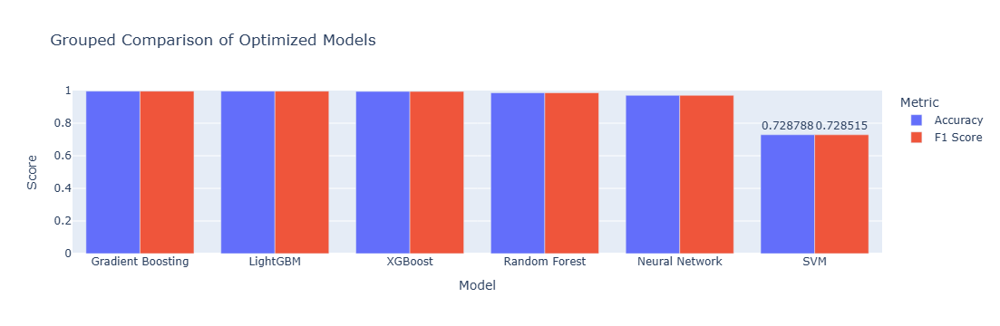

In [53]:
import plotly.express as px
import pandas as pd

data = {
    "Model": ["Gradient Boosting", "LightGBM", "XGBoost", "Random Forest", "Neural Network", "SVM"],
    "Accuracy": [0.996203, 0.996203, 0.994388, 0.986464, 0.970452, 0.728788],
    "F1 Score": [0.996205, 0.996204, 0.994384, 0.986454, 0.970443, 0.728515]
}

df = pd.DataFrame(data)
df_melted = df.melt(id_vars='Model', var_name='Metric', value_name='Score')

fig = px.bar(
    df_melted, x="Model", y="Score", color="Metric",
    barmode="group", text="Score",
    title="Grouped Comparison of Optimized Models"
)
fig.update_traces(texttemplate='%{text:.6f}', textposition='outside')
fig.update_layout(yaxis=dict(range=[0, 1]))
fig.show()

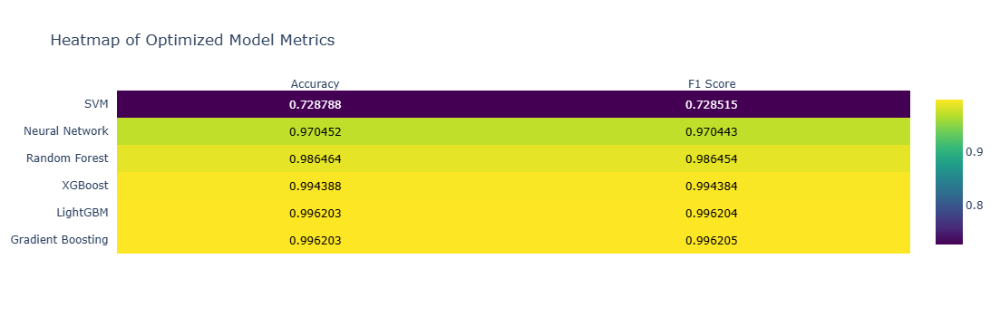

In [57]:
import plotly.figure_factory as ff

fig = ff.create_annotated_heatmap(
    z=df.set_index("Model")[["Accuracy", "F1 Score"]].values,
    x=["Accuracy", "F1 Score"],
    y=df["Model"].tolist(),
    colorscale='Viridis',
    showscale=True
)
fig.update_layout(title="Heatmap of Optimized Model Metrics")
fig.show()

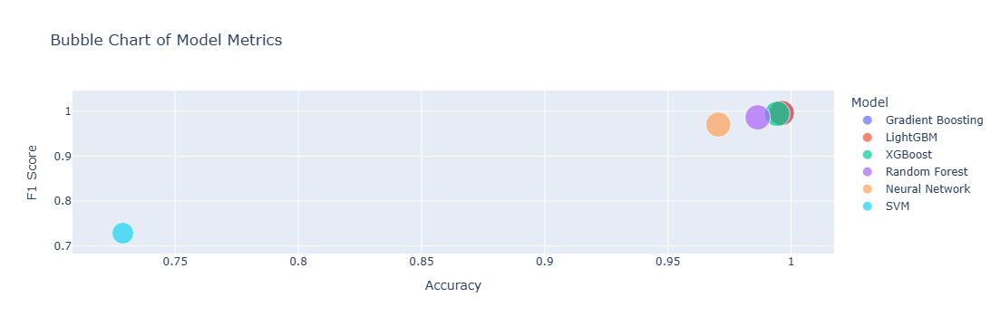

In [59]:
fig = px.scatter(
    df, x="Accuracy", y="F1 Score", size="Accuracy",
    color="Model", hover_name="Model", title="Bubble Chart of Model Metrics"
)
fig.show()

In [67]:
import pandas as pd

# Без оптимизации
data_no_opt = {
    "Model": ["LightGBM", "XGBoost", "Gradient Boosting", "Random Forest",
              "Extra Trees", "Decision Tree", "AdaBoost", "Neural Network (MLP)",
              "SVM", "KNN", "Logistic Regression"],
    "Accuracy": [0.979290, 0.975636, 0.886554, 0.782701, 0.730014, 0.654637,
                 0.642912, 0.626313, 0.604081, 0.508756, 0.498249],
    "F1 Score": [0.979284, 0.975668, 0.886501, 0.782059, 0.727092, 0.657030,
                 0.642321, 0.628259, 0.603293, 0.508364, 0.491866]
}

# С оптимизацией
data_opt = {
    "Model": ["Gradient Boosting", "LightGBM", "XGBoost", "Random Forest",
              "Neural Network", "SVM"],
    "Accuracy": [0.996203, 0.996203, 0.994388, 0.986464, 0.970452, 0.728788],
    "F1 Score": [0.996205, 0.996204, 0.994384, 0.986454, 0.970443, 0.728515]
}

df_no_opt = pd.DataFrame(data_no_opt)
df_opt = pd.DataFrame(data_opt)

# Оставляем только общие модели для сравнения
common_models = set(df_no_opt["Model"]) & set(df_opt["Model"])
df_no_opt = df_no_opt[df_no_opt["Model"].isin(common_models)].set_index("Model")
df_opt = df_opt[df_opt["Model"].isin(common_models)].set_index("Model")

# Добавим колонку для оптимизации
df_no_opt['Optimization'] = 'No'
df_opt['Optimization'] = 'Yes'

# Объединяем
df_all = pd.concat([df_no_opt, df_opt]).reset_index()

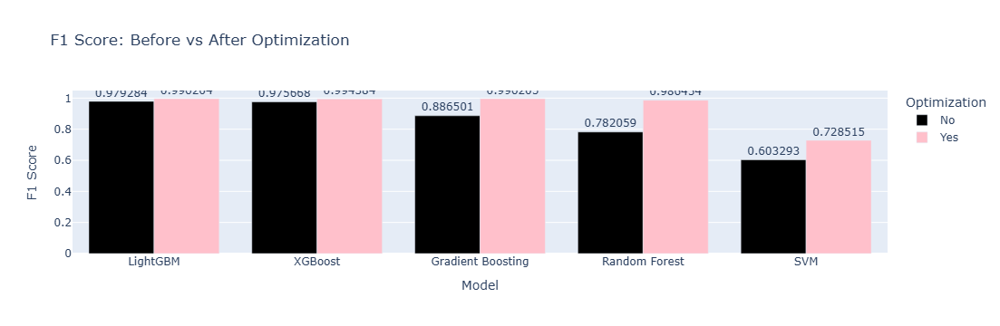

In [85]:
import plotly.express as px

color_map_f1 = {"No": "black", "Yes": "pink"}

fig_f1 = px.bar(
    df_all, x="Model", y="F1 Score",
    color="Optimization",
    color_discrete_map=color_map_f1,
    barmode="group",
    text="F1 Score",
    title="F1 Score: Before vs After Optimization"
)
fig_f1.update_traces(texttemplate='%{text:.6f}', textposition='outside')
fig_f1.show()

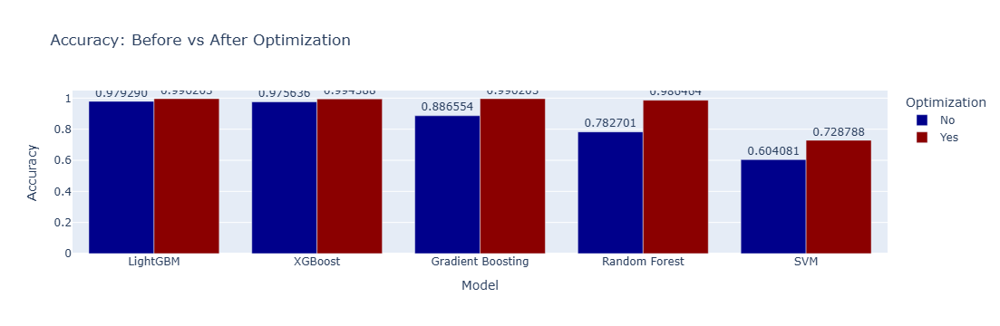

In [87]:
color_map_acc = {"No": "darkblue", "Yes": "darkred"}

fig_acc = px.bar(
    df_all, x="Model", y="Accuracy",
    color="Optimization",
    color_discrete_map=color_map_acc,
    barmode="group",
    text="Accuracy",
    title="Accuracy: Before vs After Optimization"
)
fig_acc.update_traces(texttemplate='%{text:.6f}', textposition='outside')
fig_acc.show()

In [63]:
import pandas as pd

# Без оптимизации
data_no_opt = {
    "Model": ["LightGBM", "XGBoost", "Gradient Boosting", "Random Forest",
              "Extra Trees", "Decision Tree", "AdaBoost", "Neural Network (MLP)",
              "SVM", "KNN", "Logistic Regression"],
    "Accuracy": [0.979290, 0.975636, 0.886554, 0.782701, 0.730014, 0.654637,
                 0.642912, 0.626313, 0.604081, 0.508756, 0.498249],
    "F1 Score": [0.979284, 0.975668, 0.886501, 0.782059, 0.727092, 0.657030,
                 0.642321, 0.628259, 0.603293, 0.508364, 0.491866]
}

# С оптимизацией
data_opt = {
    "Model": ["Gradient Boosting", "LightGBM", "XGBoost", "Random Forest",
              "Neural Network", "SVM"],
    "Accuracy": [0.996203, 0.996203, 0.994388, 0.986464, 0.970452, 0.728788],
    "F1 Score": [0.996205, 0.996204, 0.994384, 0.986454, 0.970443, 0.728515]
}

df_no_opt = pd.DataFrame(data_no_opt)
df_opt = pd.DataFrame(data_opt)

# Оставляем только общие модели
common_models = set(df_no_opt["Model"]) & set(df_opt["Model"])
df_no_opt = df_no_opt[df_no_opt["Model"].isin(common_models)].set_index("Model")
df_opt = df_opt[df_opt["Model"].isin(common_models)].set_index("Model")

# Считаем разницу
df_diff = df_opt - df_no_opt
df_diff = df_diff.reset_index()
df_diff

,Model,Accuracy,F1 Score
0,Gradient Boosting,0.109649,0.109704
1,LightGBM,0.016913,0.016920
2,Random Forest,0.203763,0.204395
3,SVM,0.124707,0.125222
4,XGBoost,0.018752,0.018716


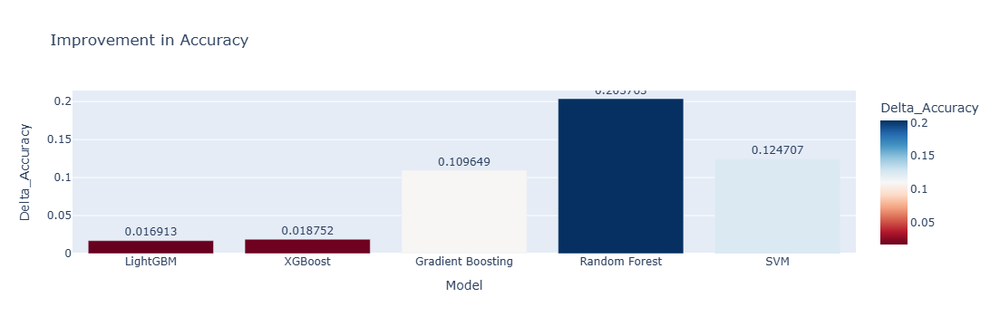

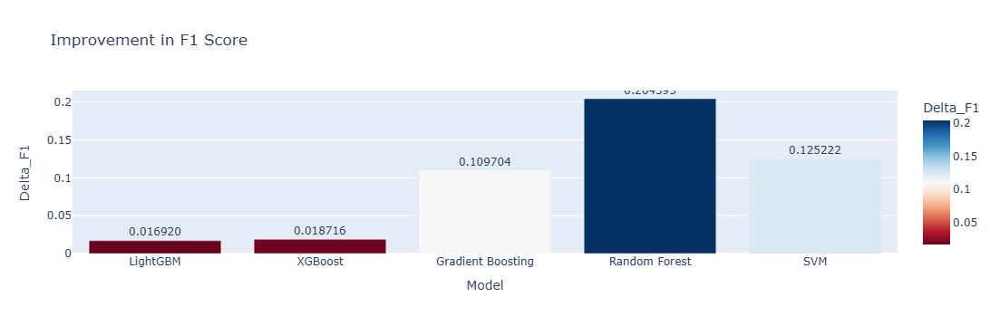

In [89]:
# Разница
df_no_opt2 = df_no_opt.reset_index()
df_opt2 = df_opt.reset_index()
df_common = df_no_opt2.merge(df_opt2, on='Model', suffixes=('_No', '_Yes'))

df_common['Delta_Accuracy'] = df_common['Accuracy_Yes'] - df_common['Accuracy_No']
df_common['Delta_F1'] = df_common['F1 Score_Yes'] - df_common['F1 Score_No']

# Delta Accuracy
fig_delta_acc = px.bar(df_common, x='Model', y='Delta_Accuracy',
                       color='Delta_Accuracy', color_continuous_scale='RdBu',
                       text='Delta_Accuracy', title="Improvement in Accuracy")
fig_delta_acc.update_traces(texttemplate='%{text:.6f}', textposition='outside')
fig_delta_acc.show()

# Delta F1
fig_delta_f1 = px.bar(df_common, x='Model', y='Delta_F1',
                      color='Delta_F1', color_continuous_scale='RdBu',
                      text='Delta_F1', title="Improvement in F1 Score")
fig_delta_f1.update_traces(texttemplate='%{text:.6f}', textposition='outside')
fig_delta_f1.show()

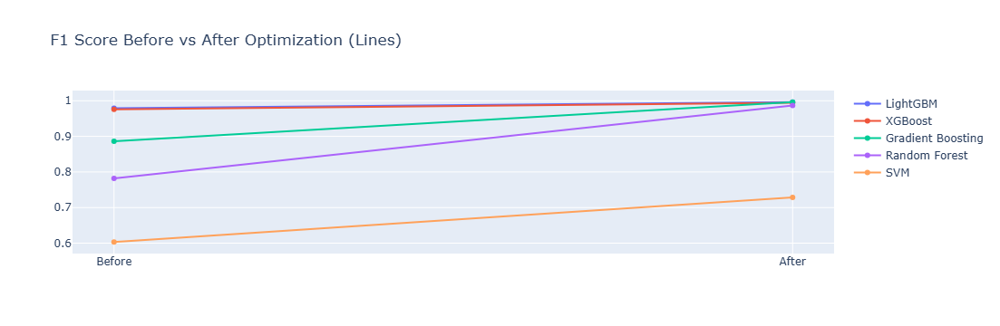

In [93]:
import plotly.graph_objects as go

fig_line = go.Figure()
for model in df_common['Model']:
    fig_line.add_trace(go.Scatter(
        x=["Before", "After"],
        y=[df_common[df_common['Model']==model]['F1 Score_No'].values[0],
           df_common[df_common['Model']==model]['F1 Score_Yes'].values[0]],
        mode='lines+markers',
        name=model
    ))
fig_line.update_layout(title="F1 Score Before vs After Optimization (Lines)")
fig_line.show()

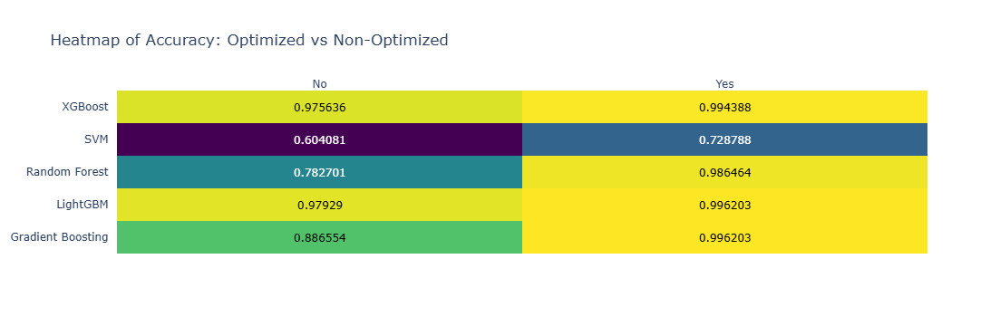

In [95]:
import plotly.figure_factory as ff

heat_data = df_all.pivot(index='Model', columns='Optimization', values='Accuracy')
fig_heat = ff.create_annotated_heatmap(z=heat_data.values,
                                       x=heat_data.columns.tolist(),
                                       y=heat_data.index.tolist(),
                                       colorscale='Viridis',
                                       annotation_text=heat_data.round(6).values)
fig_heat.update_layout(title="Heatmap of Accuracy: Optimized vs Non-Optimized")
fig_heat.show()

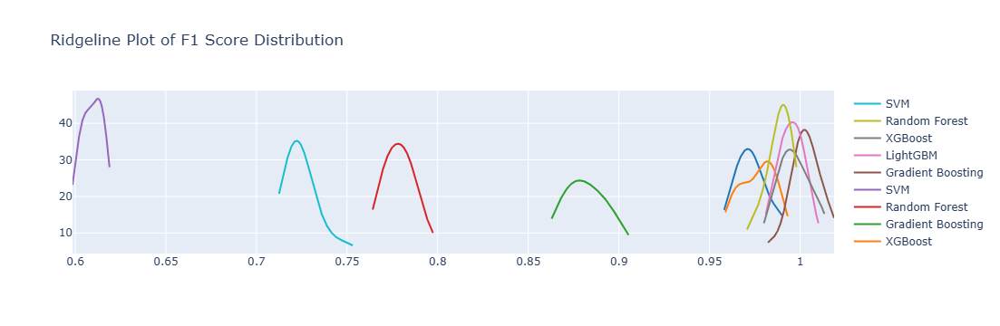

In [99]:
import plotly.figure_factory as ff

# Пример данных кросс-валидации (заменить на реальные)
import numpy as np
hist_data = [np.random.normal(loc=val, scale=0.01, size=10) for val in df_all['F1 Score']]
group_labels = df_all['Model'].tolist()
fig_ridgeline = ff.create_distplot(hist_data, group_labels, show_hist=False, show_rug=False)
fig_ridgeline.update_layout(title="Ridgeline Plot of F1 Score Distribution")
fig_ridgeline.show()


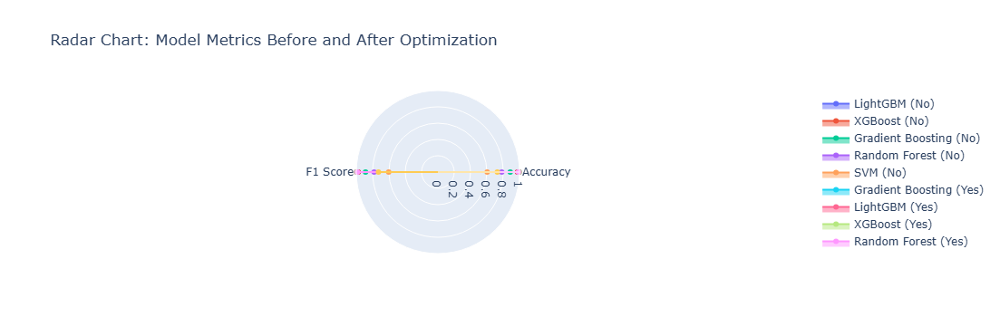

In [101]:
import plotly.graph_objects as go

categories = ['Accuracy', 'F1 Score']

fig_radar = go.Figure()

for i, row in df_all.iterrows():
    fig_radar.add_trace(go.Scatterpolar(
        r=[row['Accuracy'], row['F1 Score']],
        theta=categories,
        fill='toself',
        name=f"{row['Model']} ({row['Optimization']})"
    ))

fig_radar.update_layout(polar=dict(radialaxis=dict(visible=True, range=[0,1])),
                        title="Radar Chart: Model Metrics Before and After Optimization")
fig_radar.show()

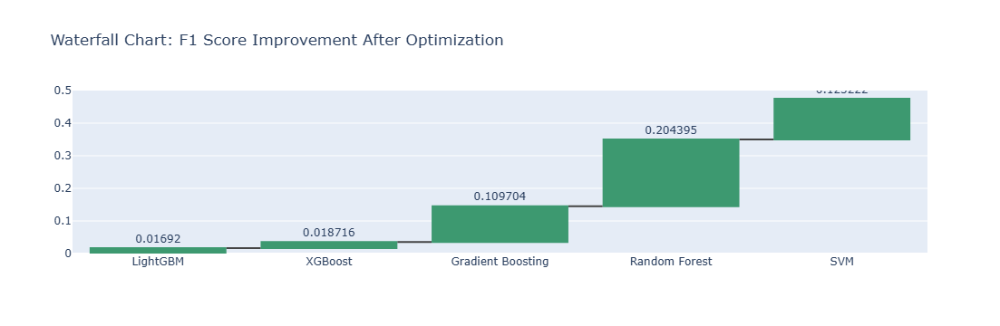

In [103]:
fig_waterfall = go.Figure(go.Waterfall(
    x=df_common['Model'],
    measure=["relative"]*len(df_common),
    y=df_common['Delta_F1'],
    text=df_common['Delta_F1'].round(6),
    textposition="outside"
))
fig_waterfall.update_layout(title="Waterfall Chart: F1 Score Improvement After Optimization")
fig_waterfall.show()

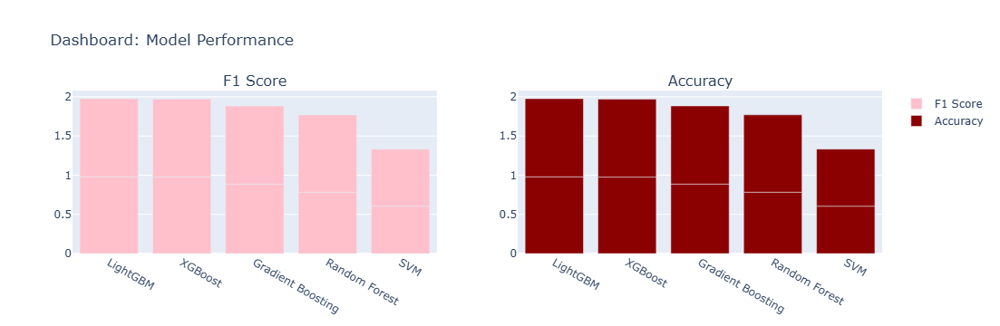

In [105]:
from plotly.subplots import make_subplots

fig_dashboard = make_subplots(rows=1, cols=2, subplot_titles=("F1 Score", "Accuracy"))

# F1
fig_dashboard.add_trace(go.Bar(x=df_all['Model'], y=df_all['F1 Score'], 
                               name='F1 Score', marker_color='pink'), row=1, col=1)

# Accuracy
fig_dashboard.add_trace(go.Bar(x=df_all['Model'], y=df_all['Accuracy'], 
                               name='Accuracy', marker_color='darkred'), row=1, col=2)

fig_dashboard.update_layout(title_text="Dashboard: Model Performance")
fig_dashboard.show()


🚀 Training Logistic Regression...

🚀 Training KNN...

🚀 Training SVM...

🚀 Training Decision Tree...

🚀 Training Random Forest...

🚀 Training Extra Trees...

🚀 Training Gradient Boosting...

🚀 Training AdaBoost...

🚀 Training XGBoost...

🚀 Training LightGBM...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 29004, number of used features: 21
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759

🚀 Training Neural Network (MLP)...


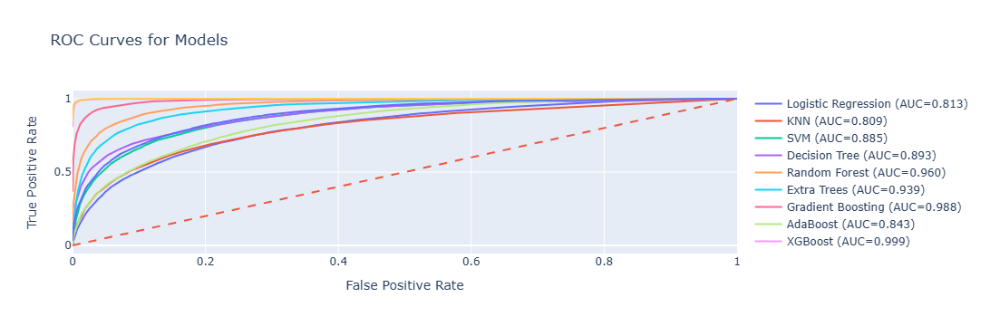

In [9]:
from sklearn.metrics import roc_curve, auc, log_loss
import plotly.graph_objects as go
import numpy as np

results = []
y_pred_proba_dict = {}  

for name, model in models.items():
    print(f"\n🚀 Training {name}...")
    model.fit(X_train_bal, y_train_bal)
    
    # Предсказание классов
    y_pred = model.predict(X_test_scaled)
    
    # Метрики
    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    results.append({'Model': name, 'Accuracy': acc, 'F1 Score': f1})
    
    # Предсказанные вероятности (для ROC и log loss)
    if hasattr(model, "predict_proba"):
        y_pred_proba = model.predict_proba(X_test_scaled)
        y_pred_proba_dict[name] = y_pred_proba
    else:
        try:
            y_scores = model.decision_function(X_test_scaled)
            exp_scores = np.exp(y_scores - np.max(y_scores, axis=1, keepdims=True))
            y_pred_proba_dict[name] = exp_scores / exp_scores.sum(axis=1, keepdims=True)
        except:
            print(f"{name} не поддерживает predict_proba или decision_function.")

# ------------------------
# ROC-кривые
# ------------------------
fig = go.Figure()
for model_name, y_prob in y_pred_proba_dict.items():
    # Бинарная классификация
    if y_prob.shape[1] == 2:
        fpr, tpr, _ = roc_curve(y_test, y_prob[:,1])
        roc_auc = auc(fpr, tpr)
        fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines',
                                 name=f'{model_name} (AUC={roc_auc:.3f})'))
    else:
        from sklearn.preprocessing import label_binarize
        y_test_bin = label_binarize(y_test, classes=np.arange(y_prob.shape[1]))
        tpr_list, fpr_list, auc_list = [], [], []
        for i in range(y_prob.shape[1]):
            fpr_i, tpr_i, _ = roc_curve(y_test_bin[:,i], y_prob[:,i])
            tpr_list.append(tpr_i)
            fpr_list.append(fpr_i)
            auc_list.append(auc(fpr_i, tpr_i))
        all_fpr = np.unique(np.concatenate(fpr_list))
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(y_prob.shape[1]):
            mean_tpr += np.interp(all_fpr, fpr_list[i], tpr_list[i])
        mean_tpr /= y_prob.shape[1]
        roc_auc = np.mean(auc_list)
        fig.add_trace(go.Scatter(x=all_fpr, y=mean_tpr, mode='lines',
                                 name=f'{model_name} (AUC={roc_auc:.3f})'))

# линия случайного угадывания
fig.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines', line=dict(dash='dash'), name='Random'))
fig.update_layout(title='ROC Curves for Models',
                  xaxis_title='False Positive Rate',
                  yaxis_title='True Positive Rate')
fig.show()

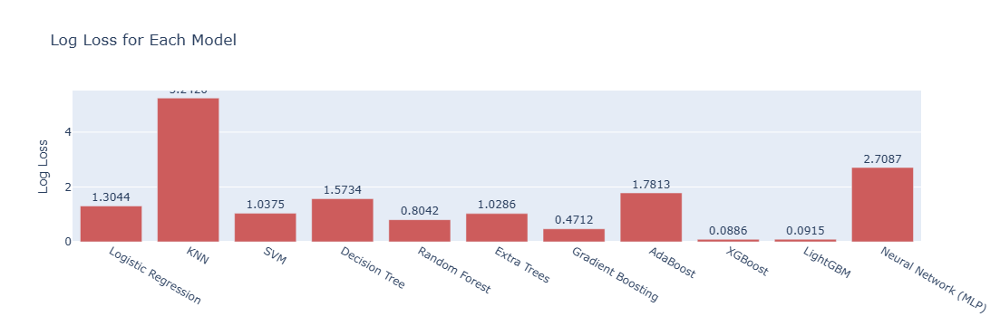

In [11]:
# ------------------------
# Log Loss
# ------------------------
logloss_scores = {}
for model_name, y_prob in y_pred_proba_dict.items():
    ll = log_loss(y_test, y_prob)
    logloss_scores[model_name] = ll

fig_ll = go.Figure(go.Bar(
    x=list(logloss_scores.keys()),
    y=list(logloss_scores.values()),
    text=[f'{v:.4f}' for v in logloss_scores.values()],
    textposition='outside',
    marker_color='indianred'
))
fig_ll.update_layout(title='Log Loss for Each Model', yaxis_title='Log Loss')
fig_ll.show()